In [1]:
# importing modules and packages
import numpy as np
import matplotlib.pyplot as plt
import pickle
import pandas as pd
from io_utils import *
from plotting_utils import *
from analysis_utils import * 
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, make_scorer, r2_score


In [2]:
# Load data into dictionary
with open('../data/fully_labeled_traces_smoothedLabels_071223_nonznorm.pickle', 'rb') as handle:
    dict = pickle.load(handle)
print(dict.keys())
print(dict[f'3095_d1_balbc_t1'].columns.tolist())

dict_keys(['29L_d1_balbc_t1', '29L_d1_balbc_t2', '29L_d1_balbc_t3', '29L_d1_obs_t1', '29L_d1_obs_t2', '29L_d1_obs_t3', '29L_d2_balbc_t1', '29L_d2_balbc_t2', '29L_d2_balbc_t3', '29L_d2_obs_t1', '29L_d2_obs_t2', '29L_d2_obs_t3', '29L_d3_balbc_t1', '29L_d3_balbc_t2', '29L_d3_balbc_t3', '29L_d3_obs_t1', '29L_d3_obs_t2', '29L_d3_obs_t3', '29L_d4_balbc_t1', '29L_d4_balbc_t2', '29L_d4_balbc_t3', '29L_d4_obs_t1', '29L_d4_obs_t2', '29L_d4_obs_t3', '29L_d5_balbc_t1', '29L_d5_balbc_t2', '29L_d5_balbc_t3', '29L_d5_obs_t1', '29L_d5_obs_t2', '29L_d5_obs_t3', '29L_d6_balbc_t1', '29L_d6_balbc_t2', '29L_d6_balbc_t3', '29L_d6_obs_t1', '29L_d6_obs_t2', '29L_d6_obs_t3', '29L_d7_balbc_t1', '29L_d7_balbc_t2', '29L_d7_balbc_t3', '29L_d7_obs_t1', '29L_d7_obs_t2', '29L_d7_obs_t3', '29L_d8_balbc_t1', '29L_d8_balbc_t2', '29L_d8_balbc_t3', '29L_d8_obs_t1', '29L_d8_obs_t2', '29L_d8_obs_t3', '29L_d9_OBSmCD1_t1', '29L_d9_OBSmCD1_t2', '29L_d9_OBSmCD1_t3', '29L_d9_mCD1_t1', '29L_d9_mCD1_t2', '29L_d9_mCD1_t3', '3095_d1

In [3]:
animalIDs = ['29L','3095','3096','3097','30B','30L','30R2','4013','4014','4015','4016','91R2']
dayIDs = ['_d1_balbc','_d2_balbc','_d3_balbc','_d4_balbc','_d5_balbc','_d6_balbc','_d7_balbc','_d8_balbc','_d9_mCD1']
obsDayIDs = []
sessionIDs = ['_t1','_t2','_t3']
allRegions = ['PrL (E)', 'PrL (I)', 'vLS (E)', 'vLS (I)', 'POA (E)', 'POA (I)', 'BNST (E)', 'BNST (I)', 'AH (E)', 'AH (I)', 'MeA (E)', 'MeA (I)', 'VMH (E)', 'VMH (I)', 'PAG (E)', 'PMv (E)', 'PMv (I)', 'LHb (E)', 'LHb (I)', 'PA (E)', 'PA (I)', 'NAc (DA)']

In [4]:
# for animal in animals:
#     for day in days:
#         for sess in sessions:
#             a = np.array(dict[animal+day+sess]['supervised labels'])
#             print(a.shape)
#             np.save(f'../data/{animal+day+sess}_aggr_labels', a)


In [5]:
print(check_exist(mouseId='30L',path=None))

(True, PosixPath('/Users/lencacuturela/Desktop/Research/github/Falkner_Multi-region_Aggression/data/30L_neural_data.csv'))


In [6]:
load_and_wrangle(mouseId='3095', path=None, overwrite=False)

,subject,other,day,trial,PrL (E),PrL (I),vLS (E),vLS (I),POA (E),POA (I),...,PAG (E),PMv (E),PMv (I),LHb (E),LHb (I),PA (E),PA (I),NAc (DA),unsupervised labels,supervised labels
0,3095,balbc,d1,t1,0.178005,0.028618,0.174659,0.097138,0.361680,-0.013241,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.034038,16.0,0
1,3095,balbc,d1,t1,0.151732,0.023553,0.178768,0.112455,0.379397,-0.027025,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.044577,16.0,0
2,3095,balbc,d1,t1,0.126230,0.008297,0.181392,0.129578,0.389964,-0.038799,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.052239,16.0,0
3,3095,balbc,d1,t1,0.099486,-0.016024,0.181167,0.143536,0.386248,-0.047815,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.057076,16.0,0
4,3095,balbc,d1,t1,0.070409,-0.044600,0.177449,0.149262,0.363240,-0.053175,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.059164,12.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550494,3095,mCD1,d9,t3,0.155548,1.125363,0.194586,1.536900,0.915171,0.722739,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.431608,5.0,0
550495,3095,mCD1,d9,t3,0.107324,1.046464,0.166127,1.435767,0.894902,0.660184,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.399813,5.0,0
550496,3095,mCD1,d9,t3,0.047590,0.955136,0.137536,1.314659,0.871601,0.585143,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.362025,5.0,0
550497,3095,mCD1,d9,t3,-0.021030,0.855087,0.109040,1.178629,0.846323,0.500516,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.319916,5.0,0


In [7]:
# # creating dataframes for each animal
# for animal in animalIDs:
#     df = load_and_wrangle(mouseId=animal, path=None, overwrite=True)
# df = load_and_wrangle(mouseId='all', path=None, overwrite=True)

In [11]:
# for mouseId in subject_ids:
#     singleFrameBehavioralDistribution(mouseId=mouseId, path=None, daysType='per day',labeltype='unsupervised')

In [12]:
# for mouseId in subject_ids:
#     singleFrameBehavioralDistribution(mouseId=mouseId, path=None, daysType='per day',labeltype='supervised')

In [9]:
# PCA for each animal

# for mouseId in subject_ids:
#     PCAfunction(mouseId=mouseId, path=None, type=None)

In [63]:
animal = '3095'
df = load_and_wrangle(mouseId=animal, path=None, overwrite=False)
df.head()

,subject,other,day,trial,PrL (E),PrL (I),vLS (E),vLS (I),POA (E),POA (I),...,PAG (E),PMv (E),PMv (I),LHb (E),LHb (I),PA (E),PA (I),NAc (DA),unsupervised labels,supervised labels
0,3095,balbc,d1,t1,0.178005,0.028618,0.174659,0.097138,0.361680,-0.013241,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.034038,16.0,0
1,3095,balbc,d1,t1,0.151732,0.023553,0.178768,0.112455,0.379397,-0.027025,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.044577,16.0,0
2,3095,balbc,d1,t1,0.126230,0.008297,0.181392,0.129578,0.389964,-0.038799,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.052239,16.0,0
3,3095,balbc,d1,t1,0.099486,-0.016024,0.181167,0.143536,0.386248,-0.047815,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.057076,16.0,0
4,3095,balbc,d1,t1,0.070409,-0.044600,0.177449,0.149262,0.363240,-0.053175,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.059164,12.0,0


In [64]:
def get_design_matrices_regression(animal, path=None, type='full', lag=0):
    ''' 
    function to prepare design matrices for regression

    parameters:
    ----------

    returns:
    --------

    x: days array of arrays
        x[day] is an array of region x time: full session or aggression moments concatenated
    '''
    # loading path on my laptop as default
    path = Path("/Users/lencacuturela/Desktop/Research/github/Falkner_Multi-region_Aggression/data") if path is None else Path(path)

    if (type not in ['full','aggression']):
        raise Exception("size ca only be in ['full','aggression']")
    
    if (int(lag) != lag or lag < 0):
        raise Exception("lag has to be a nonnegative integer")

    df = load_and_wrangle(mouseId=animal, path=path, overwrite=False)
    days = np.unique(df['day'])
    df = df.drop(columns=['subject','other','trial','unsupervised labels'])
    # drop columns that only have missing values
    for col in df.columns:
        if df[col].isna().sum() == len(df.index.tolist()): # dropping columns with only missing values
            df = df.drop(columns=[col])

    # column names for recorded regions for this animal
    xRegions = list(df.columns)
    xRegions.remove('day')
    xRegions.remove('supervised labels')

    x = np.empty((days.shape[0]), dtype=object)
    xLagged = np.empty((days.shape[0]), dtype=object)
    for indDay in range(0, len(days)):
        dftemp = df[df['day'] == days[indDay]].reset_index()
        if (type == 'aggression'):
            indInterest = (dftemp[dftemp['supervised labels']==1]).index.tolist()
        else:
            indInterest = dftemp.index.tolist()
        dftemp = dftemp.drop(columns=['day','supervised labels'])
        indLagged = [x - lag for x in indInterest if x >= lag] # gets rid of indices that go under 0 when lagged
        indAligned = [x + lag for x in indLagged] # recalibrates length of array that is not lagged to match lagged one
        x[indDay] = np.array(dftemp.loc[indAligned, xRegions])
        xLagged[indDay] = np.array(dftemp.loc[indLagged, xRegions])
    return x, xLagged, xRegions

x, xLagged, xRegions = get_design_matrices(animal, path=None, type='aggression', lag=4)


In [67]:
import seaborn as sns
def plot_array(array, regions, order, title='', scale=[0,1]):
    sortedRegions = [regions[i] for i in order]
    sortedArray = array[order,:][:,order]

    plt.figure(figsize=(16, 16))
    s = sns.heatmap(np.round(sortedArray,2), annot=True, cmap="vlag", fmt='g', vmin=scale[0], vmax=scale[1], linewidths=1, linecolor='black',clip_on=False, cbar=False)
    s.set(xlabel='target', ylabel='regressor', title=title, xticklabels=sortedRegions, yticklabels=sortedRegions)

# Linear Regression of one region against all others

In [82]:
def fit_ridge(X, y, verbose=0):
    # STANDARDIZE OR NORMALIZE?

    # CV for findings best hyperparameters
    # Define the hyperparameters to search over
    param_grid = {'alpha': [0.01, 1, 100]} # {'alpha': [0.001, 0.01, 0.1, 1, 10, 100]}

    # Define ridge regression model
    model = Ridge(fit_intercept=True, normalize=True, solver='svd') 

    # Use GridSearchCV to perform a grid search with cross-validation
    grid_search = GridSearchCV(model, param_grid, cv=3, scoring=make_scorer(r2_score))

    # Fit the grid search to the training data
    grid_search.fit(X, y)

    # Get the best hyperparameters found by the grid search
    best_params = grid_search.best_params_
    if verbose == 1:
        print('Best hyperparameters:', grid_search.best_params_)
        print('Best score:', grid_search.best_score_)

    # Train a new SVM classifier using the best hyperparameters
    best_model = Ridge(alpha=best_params['alpha'], fit_intercept=True, normalize=True) # rbf
    best_model.fit(X, y)
    weight = best_model.coef_[0]
    score = best_model.score(X, y)

    # train a model with a missing variable for each columns of x
    score_individual = np.zeros((X.shape[1]))
    for i in range(X.shape[1]):
        partial_model = Ridge(alpha=best_params['alpha'], fit_intercept=True, normalize=True)
        selector = [a for a in range(X.shape[1]) if a!=i]
        partial_model.fit(X[:,selector], y)
        score_individual[i] = partial_model.score(X[:,selector], y)
    score_individual = score - score_individual

    return  score, weight, best_params['alpha'], score_individual
fit_ridge(x[0][:,:-1], x[0][:,-1].reshape(-1,1), verbose=0)

/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Ridge())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To repr

(0.6033229273830405,
 array([ 0.09775768,  0.06808343,  0.41546256,  0.01179055,  0.10394044,
        -0.00594419,  0.19338386, -0.08077787, -0.03385792, -0.07317901,
        -0.03010437,  0.00836851,  0.01443025,  0.06169566, -0.00738089,
         0.01217448,  0.04371224, -0.00183386,  0.04350083,  0.00693355,
        -0.00065203]),
 1,
 array([ 1.40009752e-02,  5.75643700e-03,  1.00644920e-01, -9.04557596e-04,
         5.07782780e-03,  3.76703042e-04,  2.37873419e-02,  6.80422996e-03,
         5.49761115e-03,  7.82354193e-03,  5.90357082e-03,  8.18831149e-04,
         8.74688036e-04,  8.23707672e-03,  2.04123796e-04, -4.75050424e-04,
         1.94599608e-03,  1.18978726e-04,  4.41690181e-04, -2.33670120e-04,
        -3.91078133e-07]))

In [86]:
animal = '30L'
lags = [0,3] # at 10 it already performs worse for full dataset

x, _, xRegions = get_design_matrices(animal, path=None, type='aggression', lag=0)
Nregions = len(xRegions)
Ndays = x.shape[0]
alpha = np.zeros((Ndays, Nregions, Nregions, len(lags)))
score = np.zeros((Ndays, Nregions, len(lags)))
score_individual = np.zeros((Ndays, Nregions, Nregions, len(lags)))
weight = np.zeros((Ndays, Nregions, Nregions, len(lags)))

exRegions = []
inRegions = []
da = []

for ind in range(0,Nregions):
    if (xRegions[ind][-2] == 'E'):
        exRegions.append(ind)
    elif (xRegions[ind][-2] == 'I'):
        inRegions.append(ind)
    elif (xRegions[ind][-2] == 'A'):
        da.append(ind)
order = exRegions + inRegions + da

for lag in range(0,len(lags)): # index of lag
    x, xLagged, xRegions = get_design_matrices(animal, path=None, type='full', lag=lags[lag])
    for day in range(0, Ndays):
        for ind in range(0,len(xRegions)): # ind is target region
            selector = [a for a in range(x[day].shape[1]) if a != ind] # all regions except one that is the target
            score[day, ind, lag], weight[day, selector, ind, lag], alpha[day, selector, ind, lag], score_individual[day, selector, ind, lag] = fit_ridge(xLagged[day][:, selector], x[day][:, ind].reshape(-1,1))
        
    # plot_array(np.mean(score, axis=0), xRegions, order, title=f'Score (lag = {lag}) - linear regression animal {animal}', scale=[0,1])
    # plot_array(np.mean(weight, axis=0), xRegions, order, title=f'Weight (lag = {lag}) - linear regression animal {animal}', scale=[-0.6,0.6])
# plot_array(np.mean(alpha, axis=0), xRegions, order, title=f'Alpha - linear regression animal {animal}', scale=[-2,2])

/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Ridge())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To repr

In [ ]:
for lag in range(0,len(lags)): # index of lag
    plot_array(np.mean(score, axis=0)[:,lag], xRegions, order, title=f'Score (lag = {lag}) - linear regression animal {animal}', scale=[0,1])
    plot_array(np.mean(weight, axis=0)[:,:,lag], xRegions, order, title=f'Weight (lag = {lag}) - linear regression animal {animal}', scale=[-0.6,0.6])
# plot_array(np.mean(alpha, axis=0), xRegions, order, title=f'Alpha - linear regression animal {animal}', scale=[-2,2])

/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Ridge())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To repr

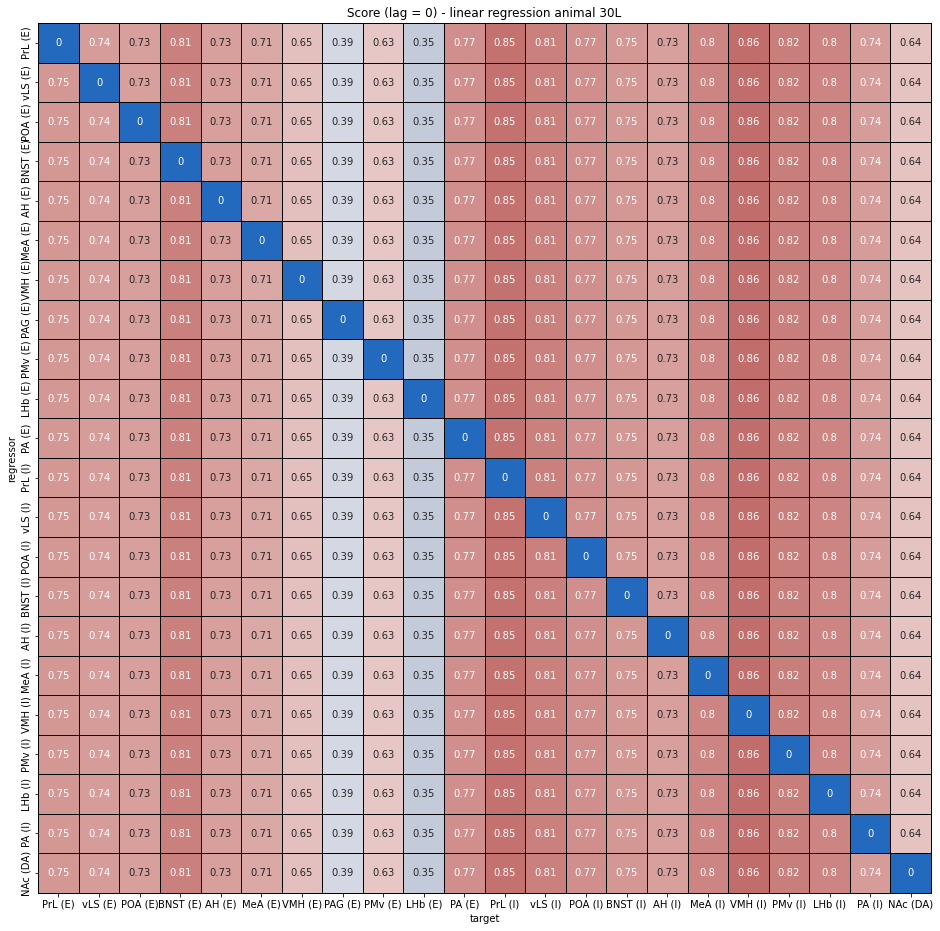

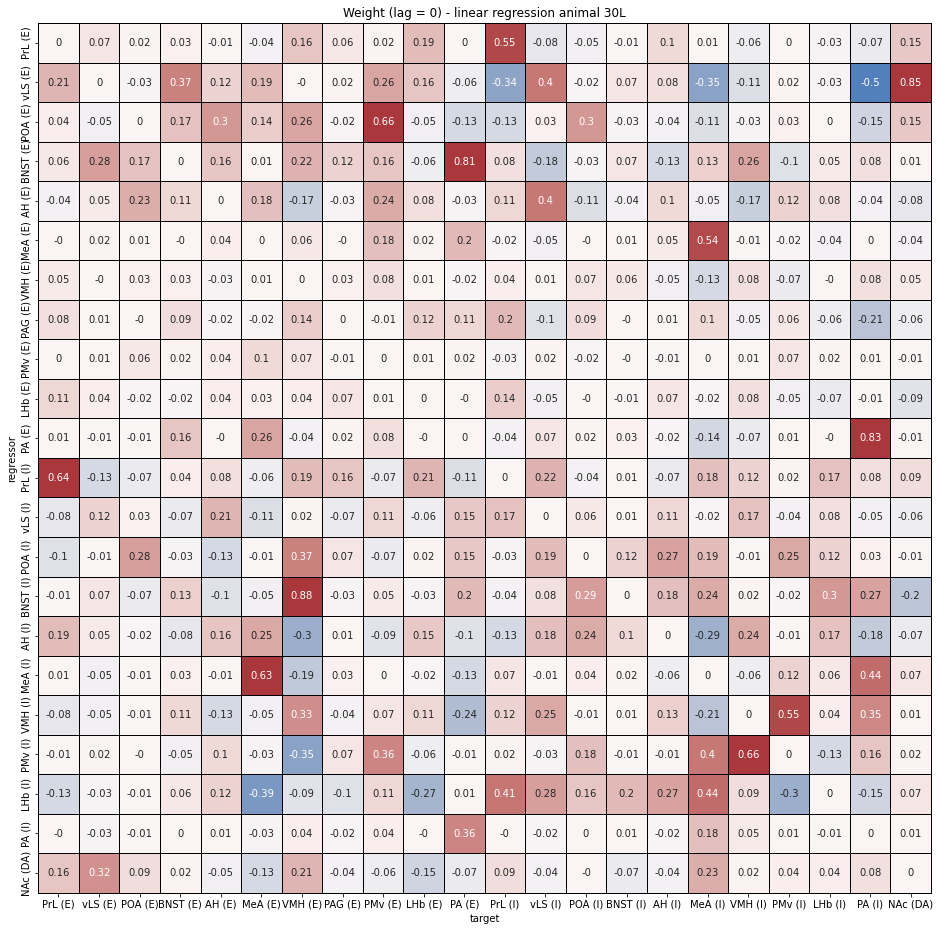

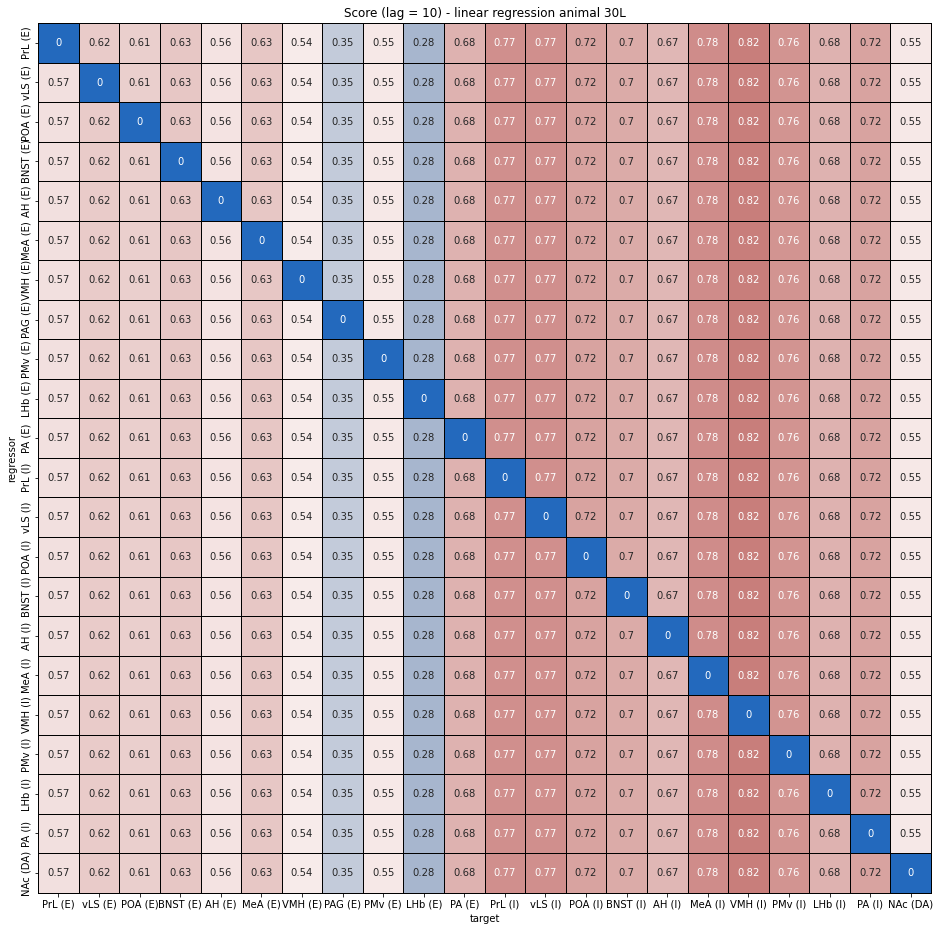

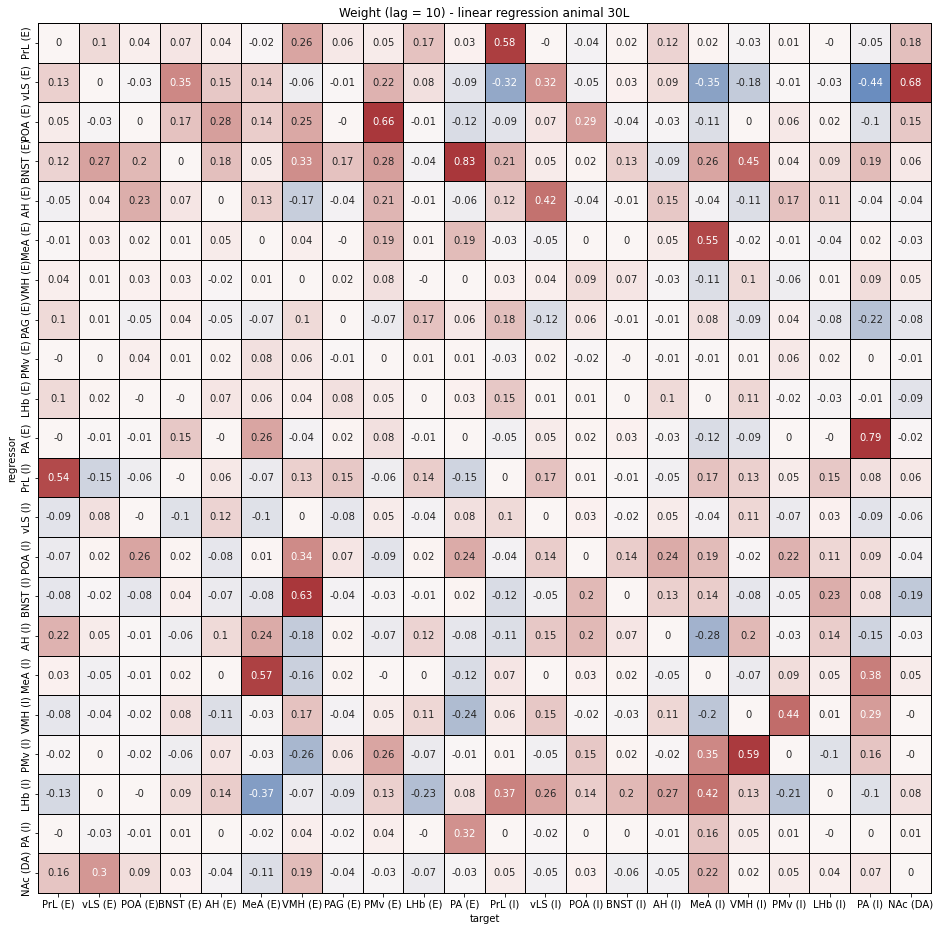

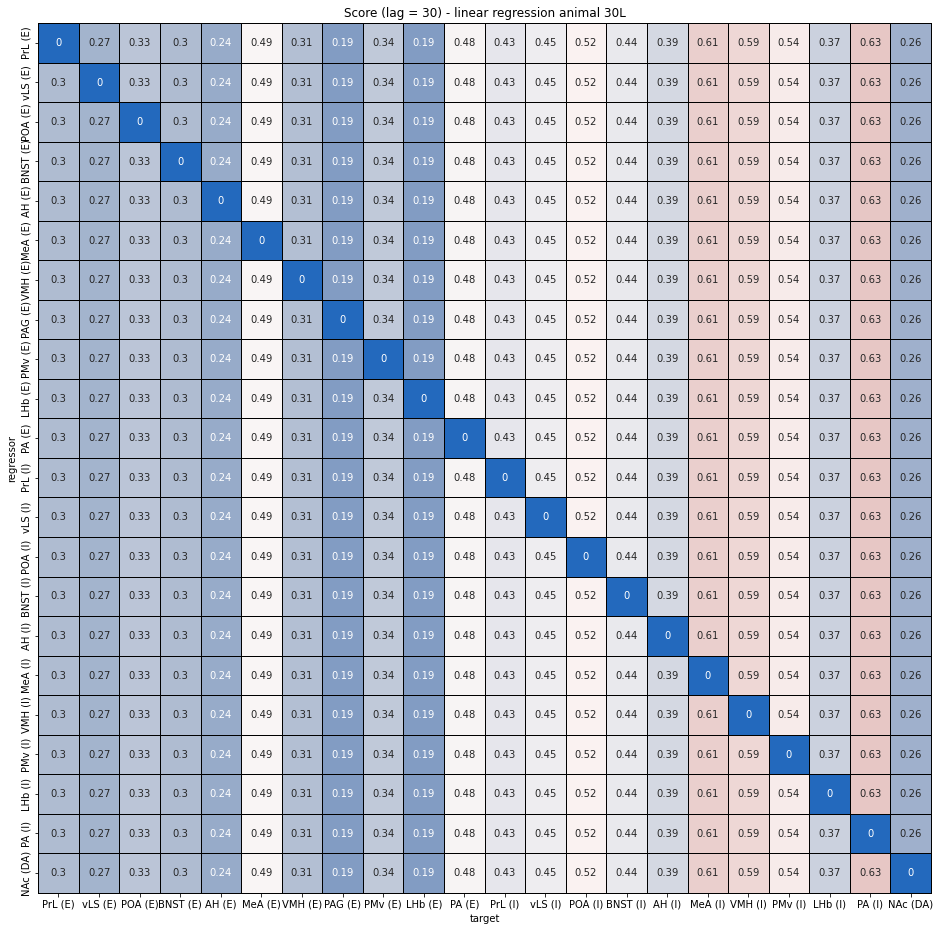

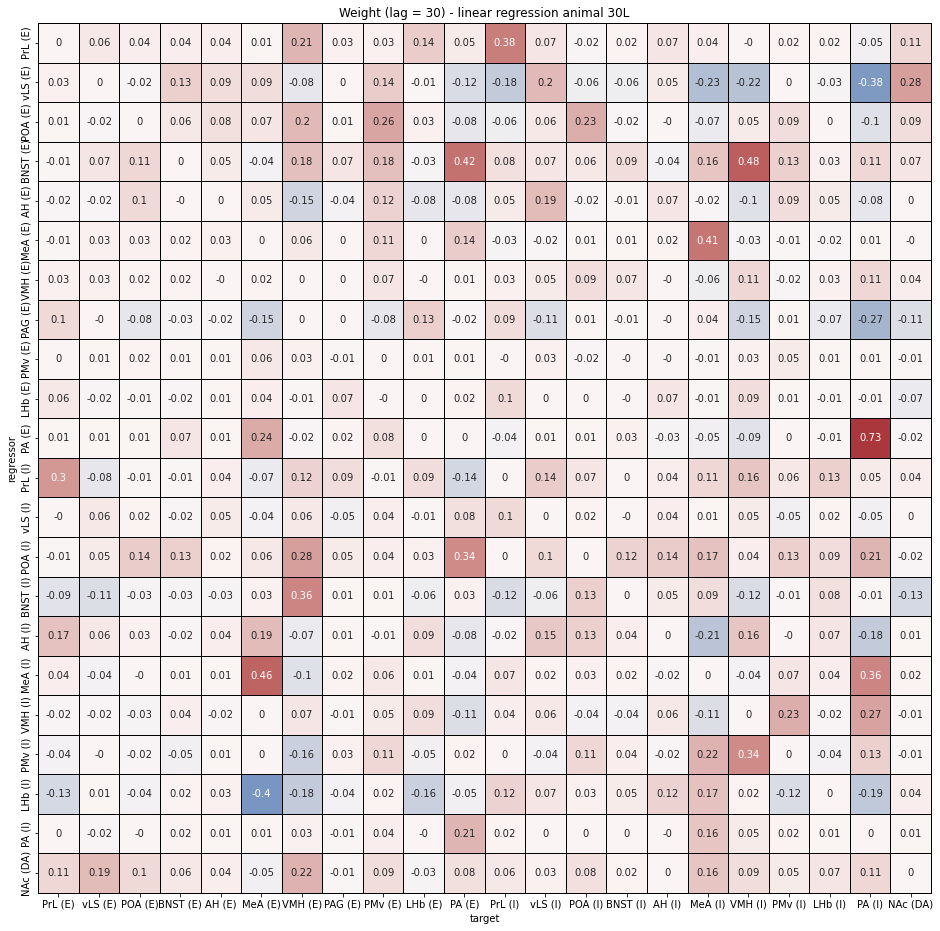

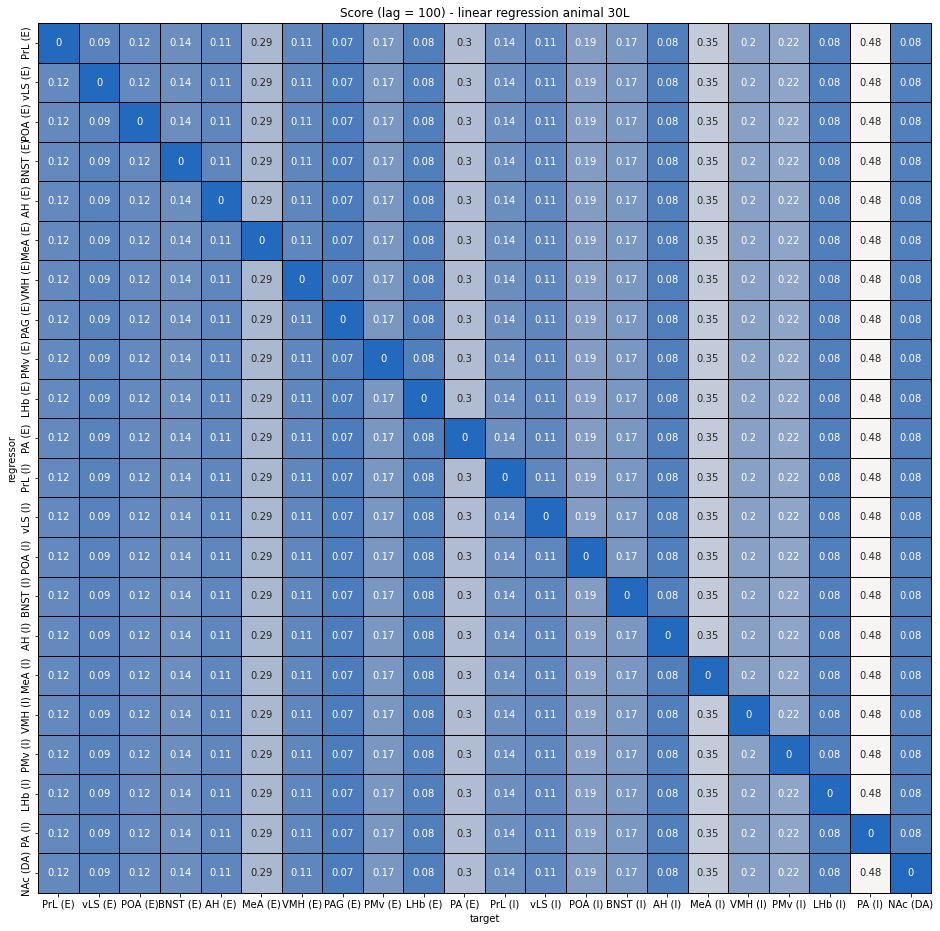

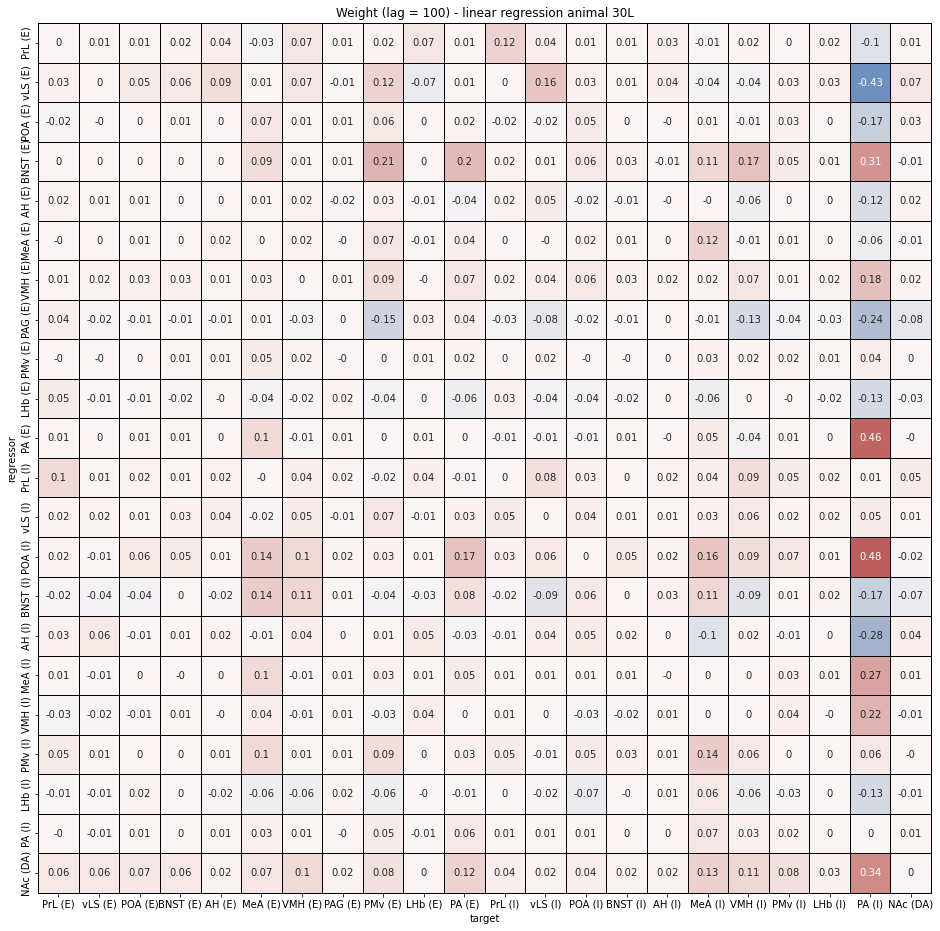

In [71]:
animal = '30L'
lags = [0,2,4,8] # at 10 it already performs worse for full dataset

x, _, xRegions = get_design_matrices(animal, path=None, type='aggression', lag=0)
Nregions = len(xRegions)
Ndays = x.shape[0]

exRegions = []
inRegions = []
da = []

for ind in range(0,Nregions):
    if (xRegions[ind][-2] == 'E'):
        exRegions.append(ind)
    elif (xRegions[ind][-2] == 'I'):
        inRegions.append(ind)
    elif (xRegions[ind][-2] == 'A'):
        da.append(ind)
order = exRegions + inRegions + da

for lag in lags:
    x, xLagged, xRegions = get_design_matrices(animal, path=None, type='full', lag=lag)
    Nregions = len(xRegions)
    Ndays = x.shape[0]
    alpha = np.zeros((Ndays, Nregions, Nregions))
    score = np.zeros((Ndays, Nregions))
    weight = np.zeros((Ndays, Nregions, Nregions))
    for day in range(0, Ndays):
        for ind in range(0,len(xRegions)): # ind is target region
            selector = [a for a in range(x[day].shape[1]) if a != ind] # all regions except one that is the target
            score[day, selector, ind], weight[day, selector, ind], alpha[day, selector, ind] = fit_ridge(xLagged[day][:, selector], x[day][:, ind].reshape(-1,1))
        
    plot_array(np.mean(score, axis=0), xRegions, order, title=f'Score (lag = {lag}) - linear regression animal {animal}', scale=[0,1])
    plot_array(np.mean(weight, axis=0), xRegions, order, title=f'Weight (lag = {lag}) - linear regression animal {animal}', scale=[-0.6,0.6])
# plot_array(np.mean(alpha, axis=0), xRegions, order, title=f'Alpha - linear regression animal {animal}', scale=[-2,2])

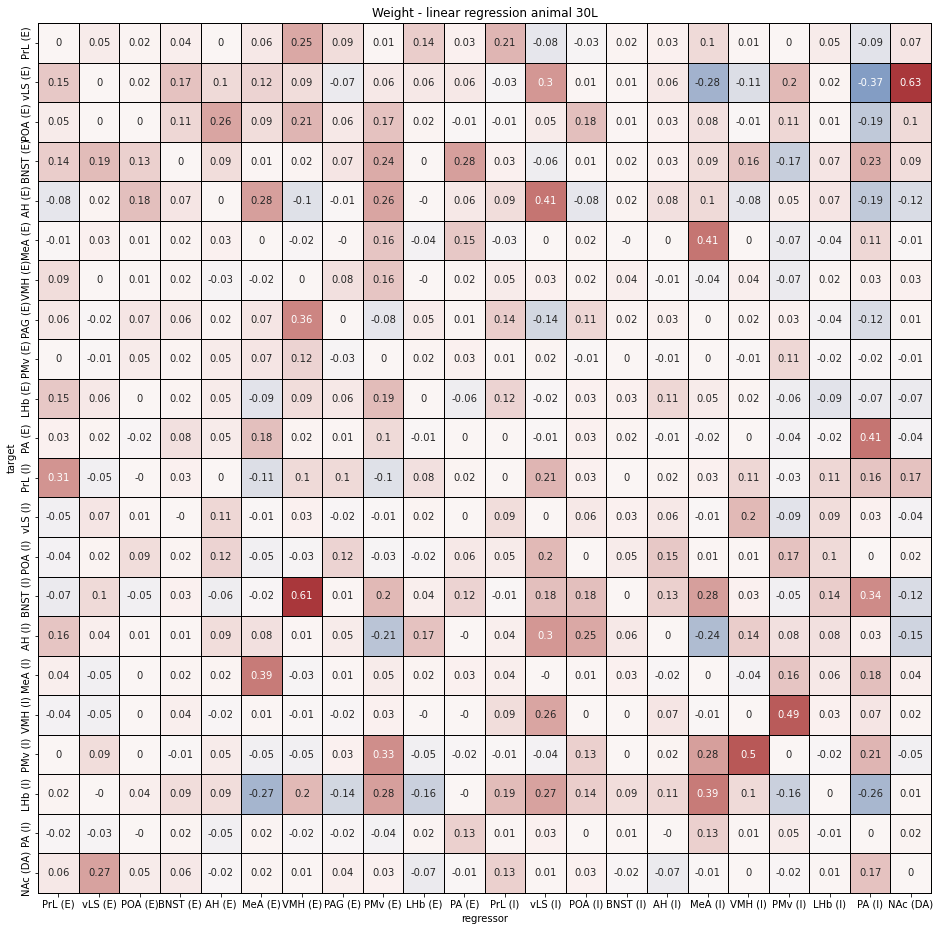

In [139]:
animal = '30L'
x, xRegions = get_design_matrices(animal, path=None, type='aggression', lag=0)
Nregions = len(xRegions)
Ndays = x.shape[0]
alpha = np.zeros((Ndays, Nregions, Nregions))
score = np.zeros((Ndays, Nregions, Nregions))
weight = np.zeros((Ndays, Nregions, Nregions))


exRegions = []
inRegions = []
da = []
for ind in range(0,Nregions):
    if (xRegions[ind][-2] == 'E'):
        exRegions.append(ind)
    elif (xRegions[ind][-2] == 'I'):
        inRegions.append(ind)
    elif (xRegions[ind][-2] == 'A'):
        da.append(ind)
order = exRegions + inRegions + da
for day in range(0, Ndays):
    for ind in range(0,len(xRegions)):
        selector = [a for a in range(x[day].shape[1]) if a != ind]
        score[day, selector, ind], weight[day, selector, ind], alpha[day, selector, ind] = fit_ridge(x[day][:, selector], x[day][:, ind].reshape(-1,1))
    
# plot_array(np.mean(score, axis=0), xRegions, order, title=f'Score - linear regression animal {animal}', scale=[0,1])
plot_array(np.mean(weight, axis=0), xRegions, order, title=f'Weight - linear regression animal {animal}', scale=[-0.6,0.6])
# plot_array(np.mean(alpha, axis=0), xRegions, order, title=f'Alpha - linear regression animal {animal}', scale=[-2,2])

In [87]:
x0 = x[0,0]
y0 = x0 * -1 + 41
y1 = (x0 + np.square(x0)/2) * -1 + 41
fit_ridge(x0, y1, verbose=0)

/Users/lencacuturela/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Ridge())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(


(0.9217627159530601, array([-2.83949814]))

# Lasso Regression of one region against all others

# Partial Least Squares Regressions

# Elastic Net Regression